# Simulating Hierarchical Bayesian Reinforcement Learning


Simulated example to illustrate the success of the methodology.

The same as before, however now $10$ individuals have their parameters sampled the population distributions:

$$\alpha^i \sim $$

----

```
author:    Zach Wolpe
email:     zachcolinwolpe@gmail.com
reviewer:  na
date:      04 January 2022
```

----

In [141]:
%%capture
!pip upgrade arviz==0.6.1
!pip install git+https://github.com/pymc-devs/pymc3
!pip install git+git://github.com/arviz-devs/arviz.git


In [5]:
!conda install -c conda-forge pymc3 -y


Solving environment: done

# All requested packages already installed.



In [6]:
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import math
import pymc3 as pm
from tqdm import tqdm
import theano
import theano.tensor as tt
import arviz as az

TypeError: data type 'float128' not understood

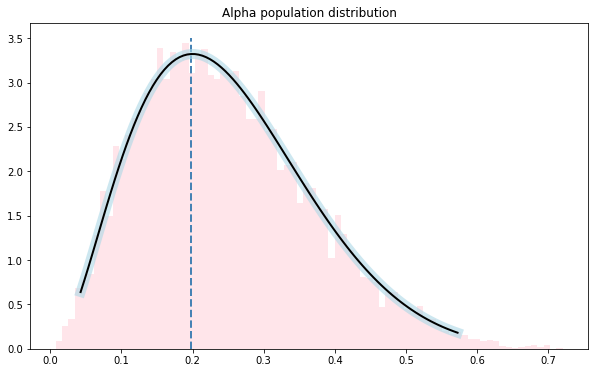

In [4]:
# alpha population distribution ------------------------------*
# params
a,b = 3,9

# distribution
mean, var, skew, kurt = stats.beta.stats(a,b, moments='mvsk')
x = np.linspace(stats.beta.ppf(0.01, a, b),
                stats.beta.ppf(0.99, a, b), 100)
y = stats.beta.pdf(x, a, b)

# random sample
rv = stats.beta(a, b)
r  = rv.rvs(size=10000)

# vis 
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(x, y, 'lightblue', lw=10, alpha=0.6, label='beta pdf')
ax.plot(x, y, 'k-', lw=2, label='frozen pdf')
ax.hist(r, bins=80, density=True, color='pink', histtype='stepfilled', alpha=0.4)
ax.vlines(x=x[np.where(y==max(y))], ymin=0, ymax=3.5, lw=2, color='steelblue', linestyles='dashed')
plt.title('Alpha population distribution')
plt.show()
# alpha population distribution ------------------------------*

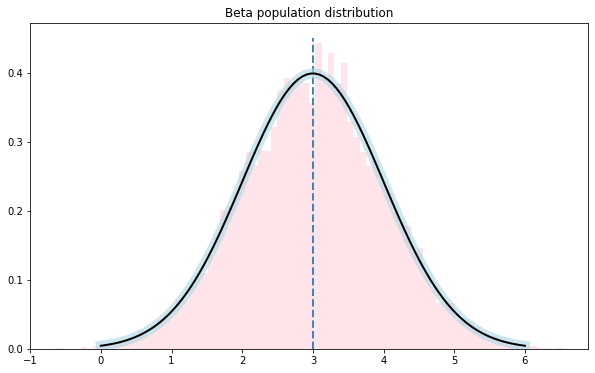

In [5]:
# beta population distribution -------------------------------*
# params
mu        = 3
variance  = 1

# distribution
sigma = math.sqrt(variance)
x     = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
y     = stats.norm.pdf(x, mu, sigma)

# random sample
rv = stats.norm(mu, sigma)
r  = rv.rvs(size=10000)

# vis 
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(x, y, 'lightblue', lw=10, alpha=0.6, label='alpha pdf')
ax.plot(x, y, 'k-', lw=2, label='frozen pdf')
ax.hist(r, bins=80, density=True, color='pink', histtype='stepfilled', alpha=0.4)
ax.vlines(x=mu, ymin=0, ymax=0.45, lw=2, color='steelblue', linestyles='dashed')
plt.title('Beta population distribution')
plt.show()
# beta population distribution -------------------------------*

# Generate Subject Data

In [6]:
%%time
# sample population distributions ------------------------------------------*
n_samples = 100
subject_betas  = stats.norm(loc=mu, scale=sigma).rvs(n_samples)
subject_alphas = stats.beta(a, b).rvs(n_samples)

CPU times: user 3.09 ms, sys: 0 ns, total: 3.09 ms
Wall time: 2.97 ms


In [7]:
# DGP ----------------------------------------------------------------------*
def data_generating_process(alpha, beta, n=100, p_r=[.8, .6, .7]):
  actions = np.zeros(n, dtype=np.int)
  rewards = np.zeros(n, dtype=np.int)
  Qs      = np.zeros((n, 3))

  # Q init
  Q = np.array(len(p_r)*[1/len(p_r)])

  for i in tqdm(range(n)):
    # P(a|Q): Apply Boltzmann distribution
    exp_Q = np.exp(beta*Q)
    pi_a  = exp_Q / np.sum(exp_Q)


    # Simulate action-reward
    a = np.random.choice([0,1,2], p=pi_a)
    r = np.random.rand() < p_r[a]

    # Update Qt(a) = Qt-1(a) + a[RPE]
    Q[a] = Q[a] + alpha * (r - Q[a])

    # store
    actions[i] = a
    rewards[i] = r
    Qs[i] = Q.copy()

  return actions, rewards, Qs  

In [8]:
# store as a dict
n = 100
data = {}
for i, theta in enumerate(zip(subject_alphas, subject_betas)):
  actions, rewards, Qs = data_generating_process(alpha=theta[0], beta=theta[1], n=n)
  data['subject_'+str(i)] = {'actions': actions, 'rewards':rewards, 'true_alpha':theta[0], 'true_beta':theta[1], 'Qs':Qs}

100%|██████████| 100/100 [00:00<00:00, 3662.76it/s]


# Method I: Summary Statistics

As a baseline point of comparison, one can use the niave method of fitting all subjects independently & then use thier estimates as samples from the population to estimate the population distribution. This is referred to as the summary statistics approach.

## Fit

Here we fit all $10$ models independently.

  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 80 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  1%|          | 1/100 [01:59<3:17:23, 119.63s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 63 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  2%|▏         | 2/100 [03:18<2:36:15, 95.67s/it] /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 55 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  3%|▎         | 3/100 [04:29<2:16:04, 84.17s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 72 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  4%|▍         | 4/100 [05:57<2:17:22, 85.86s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 62 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  5%|▌         | 5/100 [07:15<2:11:22, 82.97s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 77 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  6%|▌         | 6/100 [08:47<2:15:09, 86.27s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 64 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  7%|▋         | 7/100 [10:08<2:10:59, 84.51s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  8%|▊         | 8/100 [11:33<2:09:42, 84.59s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 90 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

  9%|▉         | 9/100 [13:19<2:18:32, 91.35s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Seque

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 10%|█         | 10/100 [14:42<2:12:54, 88.61s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 63 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 11%|█         | 11/100 [16:01<2:07:17, 85.81s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 64 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 12%|█▏        | 12/100 [17:22<2:03:27, 84.18s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 74 seconds.
The acceptance probability does not match the target. It is 0.7549799448107255, but should be close to 0.85. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 13%|█▎        | 13/100 [18:52<2:04:36, 85.94s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chai

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 70 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 14%|█▍        | 14/100 [20:18<2:03:24, 86.09s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 65 seconds.
The acceptance probability does not match the target. It is 0.9271733587283176, but should be close to 0.85. Try to increase the number of tuning steps.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 15%|█▌        | 15/100 [21:39<1:59:39, 84.47s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 16%|█▌        | 16/100 [23:05<1:58:54, 84.94s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 70 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 17%|█▋        | 17/100 [24:31<1:57:49, 85.17s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 83 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 18%|█▊        | 18/100 [26:10<2:02:14, 89.45s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 98 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 19%|█▉        | 19/100 [28:05<2:11:09, 97.15s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 73 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

 20%|██        | 20/100 [29:35<2:06:32, 94.91s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 92 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There were 7 divergences after tuning. Increase `target_accept` or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 21%|██        | 21/100 [31:22<2:10:00, 98.74s/it]/usr/loca

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 82 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 22%|██▏       | 22/100 [33:01<2:08:05, 98.54s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 23%|██▎       | 23/100 [34:16<1:57:40, 91.69s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 73 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 24%|██▍       | 24/100 [35:45<1:55:00, 90.80s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 25%|██▌       | 25/100 [37:10<1:51:19, 89.06s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 81 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 26%|██▌       | 26/100 [38:47<1:52:38, 91.33s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 70 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 27%|██▋       | 27/100 [40:14<1:49:30, 90.01s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 58 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 28%|██▊       | 28/100 [41:27<1:42:07, 85.11s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 81 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 29%|██▉       | 29/100 [43:05<1:45:10, 88.88s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 55 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 30%|███       | 30/100 [44:17<1:37:39, 83.71s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 67 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 31%|███       | 31/100 [45:40<1:36:15, 83.70s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 67 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 32%|███▏      | 32/100 [47:03<1:34:42, 83.57s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
The acceptance probability does not match the target. It is 0.935513883827139, but should be close to 0.85. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 33%|███▎      | 33/100 [48:28<1:33:29, 83.73s/it]/usr/local/lib/python3.7/dist-pac

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 91 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 34%|███▍      | 34/100 [50:14<1:39:41, 90.63s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 72 seconds.
The acceptance probability does not match the target. It is 0.7518842683796604, but should be close to 0.85. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9279610096728261, but should be close to 0.85. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. 

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 36%|███▌      | 36/100 [52:59<1:31:28, 85.76s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 76 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 37%|███▋      | 37/100 [54:31<1:31:57, 87.58s/it]/usr/local/lib/python3.

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 85 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 38%|███▊      | 38/100 [56:13<1:35:03, 91.99s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 64 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 39%|███▉      | 39/100 [57:33<1:29:46, 88.30s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 40%|████      | 40/100 [58:58<1:27:25, 87.43s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 83 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 41%|████      | 41/100 [1:00:37<1:29:18, 90.82s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 70 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 42%|████▏     | 42/100 [1:02:03<1:26:24, 89.39s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 92 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 43%|████▎     | 43/100 [1:03:52<1:30:23, 95.15s/it]/usr/loca

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 44%|████▍     | 44/100 [1:05:17<1:26:11, 92.35s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 45%|████▌     | 45/100 [1:06:41<1:22:23, 89.88s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 79 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 46%|████▌     | 46/100 [1:08:17<1:22:19, 91.48s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 61 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 47%|████▋     | 47/100 [1:09:34<1:16:59, 87.17s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 48%|████▊     | 48/100 [1:10:56<1:14:15, 85.68s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 49%|████▉     | 49/100 [1:12:20<1:12:21, 85.12s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 76 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 50%|█████     | 50/100 [1:13:52<1:12:45, 87.31s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 71 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 51%|█████     | 51/100 [1:15:20<1:11:24, 87.45s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 74 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 52%|█████▏    | 52/100 [1:16:50<1:10:40, 88.35s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 76 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 53%|█████▎    | 53/100 [1:18:22<1:10:04, 89.46s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 75 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 54%|█████▍    | 54/100 [1:19:54<1:09:10, 90.23s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 71 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 55%|█████▌    | 55/100 [1:21:22<1:07:05, 89.46s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
The acceptance probability does not match the target. It is 0.7787147414587624, but should be close to 0.85. Try to increase the number of tuning steps.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 56%|█████▌    | 56/100 [1:22:38<1:02:31, 85.26s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample wil

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 75 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 57%|█████▋    | 57/100 [1:24:07<1:02:00, 86.53s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 70 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 58%|█████▊    | 58/100 [1:25:33<1:00:31, 86.47s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 80 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 59%|█████▉    | 59/100 [1:27:10<1:01:14, 89.61s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Y

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 54 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 60%|██████    | 60/100 [1:28:21<55:59, 83.98s/it]  /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 68 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 61%|██████    | 61/100 [1:29:46<54:47, 84.29s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 62%|██████▏   | 62/100 [1:31:09<53:03, 83.78s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 63%|██████▎   | 63/100 [1:32:32<51:29, 83.51s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 64%|██████▍   | 64/100 [1:33:47<48:41, 81.16s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 91 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 65%|██████▌   | 65/100 [1:35:35<51:53, 88.97s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 79 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 66%|██████▌   | 66/100 [1:37:10<51:29, 90.87s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 65 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 67%|██████▋   | 67/100 [1:38:29<48:04, 87.41s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 68%|██████▊   | 68/100 [1:39:55<46:24, 87.02s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 63 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 69%|██████▉   | 69/100 [1:41:14<43:44, 84.65s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 77 seconds.
The acceptance probability does not match the target. It is 0.9419481293399214, but should be close to 0.85. Try to increase the number of tuning steps.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 70%|███████   | 70/100 [1:42:48<43:39, 87.33s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will 

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 64 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 71%|███████   | 71/100 [1:44:09<41:13, 85.28s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 72 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 72%|███████▏  | 72/100 [1:45:35<40:00, 85.74s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 96 seconds.
The acceptance probability does not match the target. It is 0.9530096258525982, but should be close to 0.85. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 73%|███████▎  | 73/100 [1:47:28<42:15, 93.92s/it]/usr/local/lib/python3.7/dist-pa

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 60 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 74%|███████▍  | 74/100 [1:48:45<38:27, 88.75s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 75%|███████▌  | 75/100 [1:50:11<36:34, 87.77s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 76%|███████▌  | 76/100 [1:51:33<34:30, 86.29s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 53 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 77%|███████▋  | 77/100 [1:52:41<30:59, 80.85s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 74 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 78%|███████▊  | 78/100 [1:54:12<30:44, 83.83s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 73 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 79%|███████▉  | 79/100 [1:55:42<29:59, 85.68s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 74 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 80%|████████  | 80/100 [1:57:13<29:06, 87.34s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 101 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 81%|████████  | 81/100 [1:59:09<30:21, 95.89s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Yo

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 94 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 82%|████████▏ | 82/100 [2:01:00<30:03, 100.19s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. Yo

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 83%|████████▎ | 83/100 [2:02:16<26:20, 93.00s/it] /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be 

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 83 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 84%|████████▍ | 84/100 [2:03:53<25:07, 94.24s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 67 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 85%|████████▌ | 85/100 [2:05:17<22:47, 91.17s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 74 seconds.
The acceptance probability does not match the target. It is 0.9237746674915297, but should be close to 0.85. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.7738960023775219, but should be close to 0.85. Try to increase the number of tuning steps.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 8

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 78 seconds.
The acceptance probability does not match the target. It is 0.9236455661334195, but should be close to 0.85. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 87%|████████▋ | 87/100 [2:08:23<20:00, 92.33s/it]/usr/local/lib/python3.7/dist-pa

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 66 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 88%|████████▊ | 88/100 [2:09:44<17:47, 88.94s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 65 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 89%|████████▉ | 89/100 [2:11:06<15:55, 86.89s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 53 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 90%|█████████ | 90/100 [2:12:16<13:37, 81.74s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 82 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 91%|█████████ | 91/100 [2:13:52<12:55, 86.13s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 65 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 92%|█████████▏| 92/100 [2:15:15<11:20, 85.09s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 62 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 93%|█████████▎| 93/100 [2:16:31<09:37, 82.45s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 61 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 94%|█████████▍| 94/100 [2:17:49<08:06, 81.09s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 65 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 95%|█████████▌| 95/100 [2:19:11<06:46, 81.37s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 78 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 96%|█████████▌| 96/100 [2:20:44<05:38, 84.68s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 60 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 97%|█████████▋| 97/100 [2:22:01<04:07, 82.39s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 77 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 98%|█████████▊| 98/100 [2:23:35<02:51, 85.91s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be s

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 69 seconds.
The number of effective samples is smaller than 25% for some parameters.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 99%|█████████▉| 99/100 [2:24:59<01:25, 85.28s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 59 seconds.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: DeprecationWarning:

The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.

/usr/local/lib/python3.7/dist-packages/arviz/plots/backends/matplotlib/traceplot.py:221: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

100%|██████████| 100/100 [2:26:15<00:00, 87.76s/it]


CPU times: user 2h 24min 48s, sys: 2min 9s, total: 2h 26min 58s
Wall time: 2h 26min 15s


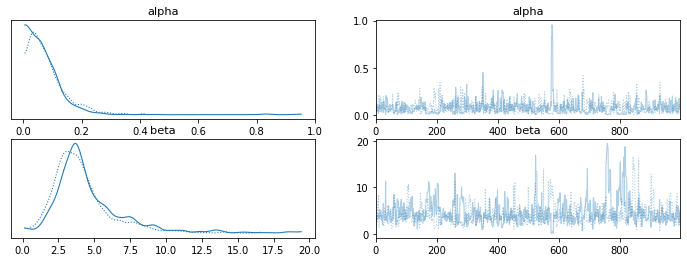

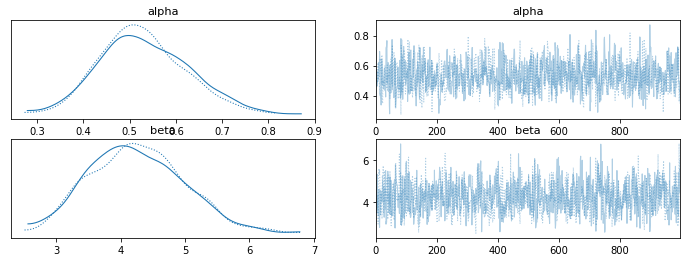

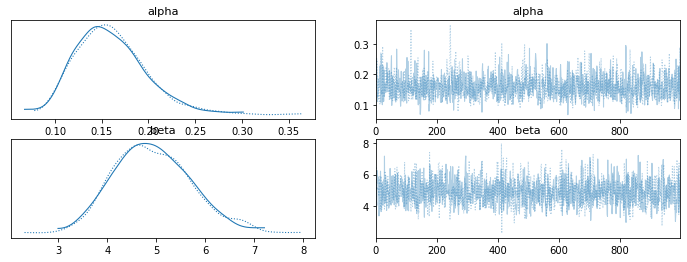

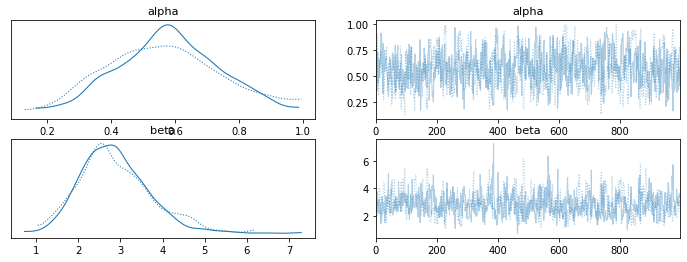

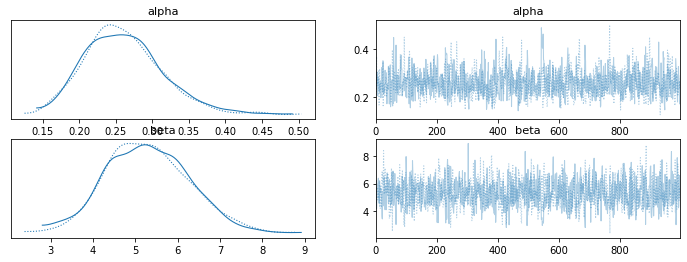

...

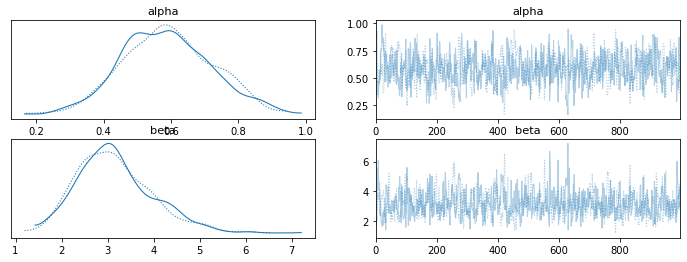

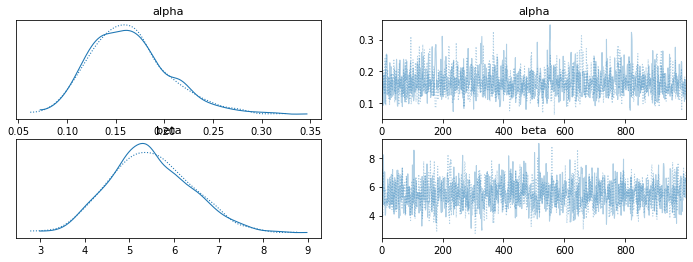

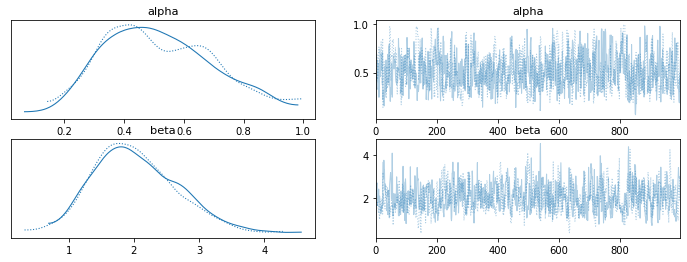

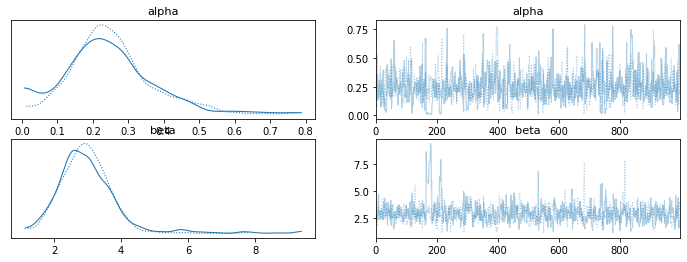

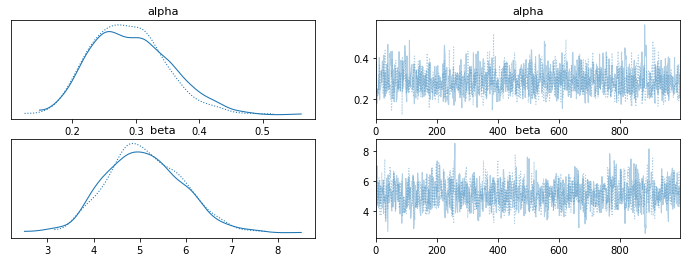

In [155]:
%%time
# Bayes RL  ==================================================================================================================================*

# each subject
for i in tqdm(range(n_samples)):
  actions = data['subject_'+str(i)]['actions']
  rewards = data['subject_'+str(i)]['rewards']

  with pm.Model() as bayesian_reinforcement_learning:

    # data
    actions_  = pm.Data('actions', actions)
    rewards_  = pm.Data('rewards', rewards)

    # priors
    alpha = pm.Beta('alpha', 1, 1)
    beta  = pm.HalfNormal('beta', 10)

    # model 
    # init Qs
    Qs = 0.3333 * tt.ones(3, dtype='float64')

    # Compute the Q values for each trial
    Qs, _ = theano.scan(
        fn=lambda action, reward, Qs, alpha: tt.set_subtensor(Qs[action], Qs[action] + alpha * (reward - Qs[action])),
        sequences=[actions_, rewards_],
        outputs_info=[Qs],
        non_sequences=[alpha])


    BQs = beta*Qs
    pi =  tt.nnet.softmax(BQs)
    like = pm.Categorical('like', p=pi, observed=actions_)

    # opt
    trace = pm.sample(tune=1000, chains=2, target_accept=0.85) # tune=5000, target_accept=0.9 njobs=4 ,target_accept=0.99
    idata = az.from_pymc3(trace)
    pm.traceplot(idata)


    # store estimates
    data['subject_'+str(i)]['trace'] = trace
    data['subject_'+str(i)]['idata'] = idata
  # Bayes RL  ==================================================================================================================================*


-----

# Summary Statistics Distribution

Now we simple use the estimates as independent samples to fit the distributions:

$$\alpha \sim \mathcal{beta}(a_{\alpha}, b_{\alpha}), \; \; \;  \beta \sim \mathcal{N}(\mu_{\beta}, \sigma_{\beta})$$


In [156]:

true_alphas   = []
true_betas    = []
approx_alpha  = []
approx_beta   = []

for i in range(10):
  true_alphas.append(data['subject_'+str(i)]['true_alpha'])
  true_betas.append(data['subject_'+str(i)]['true_beta'])
  # approx_alpha.append(data['subject_'+str(i)]['trace']['alpha'])
  # approx_beta.append(data['subject_'+str(i)]['trace']['beta'])
  # means 
  approx_alpha.append(data['subject_'+str(i)]['trace']['alpha'].mean())
  approx_beta.append(data['subject_'+str(i)]['trace']['beta'].mean())


In [157]:
trace['alpha'].std()

0.06007944915605776

In [132]:
data['subject_'+str(i)]['trace']['alpha'].mean()

0.17771872426955176

In [178]:
# https://stats.stackexchange.com/questions/68983/beta-distribution-fitting-in-scipy
a_al_true, b_al_true, loc_al_true, scale_al_true = stats.beta.fit(true_alphas, floc=0, fscale=1)
a_al_aprx, b_al_aprx, loc_al_aprx, scale_al_aprx = stats.beta.fit(approx_alpha, floc=0, fscale=1)

beta_true_mu, beta_true_std = stats.norm.fit(true_betas)
beta_aprx_mu, beta_aprx_std = stats.norm.fit(approx_beta)


In [179]:
beta_true_mu, beta_true_std, beta_aprx_mu, beta_aprx_std

(3.108770229597089, 0.9595894475151323, 3.4020817685092277, 1.1838876850803135)

In [180]:
for i, j in zip(['a', 'b', 'loc', 'scale'], [a_al_true, b_al_true, loc_al_true, scale_al_true]):
  print(i, ': ', str(round(j,2)))

print('-----')
for i, j in zip(['a', 'b', 'loc', 'scale'], [a_al_aprx, b_al_aprx, loc_al_aprx, scale_al_aprx]):
  print(i, ': ', str(round(j,2)))


a :  4.56
b :  10.27
loc :  0
scale :  1
-----
a :  2.09
b :  3.86
loc :  0
scale :  1


# Assess Fit: Summary Statistics Method

**COMPLETELY FAILED TO CONVERGE**

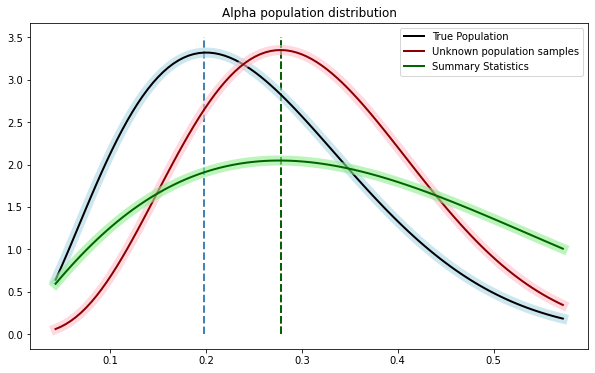

In [191]:
# alpha population distribution ------------------------------*
# params
a,b = 3,9

# distribution
mean, var, skew, kurt = stats.beta.stats(a,b, moments='mvsk')
x = np.linspace(stats.beta.ppf(0.01, a, b),
                stats.beta.ppf(0.99, a, b), 100)
y = stats.beta.pdf(x, a, b)

# random sample
rv = stats.beta(a, b)
r  = rv.rvs(size=10000)

# vis 
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(x, y, 'lightblue', lw=10, alpha=0.6)
ax.plot(x, y, 'k-', lw=2, label='True Population')
ax.vlines(x=x[np.where(y==max(y))], ymin=0, ymax=3.5, lw=2, color='steelblue', linestyles='dashed')

# fit (unknown) true sample values
rv_alpha_true = stats.beta(a=a_al_true, b=b_al_true, loc=loc_al_true, scale=scale_al_true).pdf(x)
ax.plot(x, rv_alpha_true, 'pink', lw=10, alpha=0.6)
ax.plot(x, rv_alpha_true, 'k-', lw=2, color='darkred', label='Unknown population samples')
ax.vlines(x=x[np.where(rv_alpha_true==max(rv_alpha_true))], ymin=0, ymax=3.5, lw=2, color='darkred', linestyles='dashed')

# fit approx values 
rv_alpha_aprx = stats.beta(a_al_aprx, b_al_aprx, loc_al_aprx, scale_al_aprx).pdf(x)
ax.plot(x, rv_alpha_aprx, 'lightgreen', lw=10, alpha=0.6)
ax.plot(x, rv_alpha_aprx, 'k-', lw=2, color='darkgreen', label='Summary Statistics')
ax.vlines(x=x[np.where(rv_alpha_aprx==max(rv_alpha_aprx))], ymin=0, ymax=3.5, lw=2, color='darkgreen', linestyles='dashed')


plt.title('Alpha population distribution')
plt.legend()
plt.show()
# alpha population distribution ------------------------------*

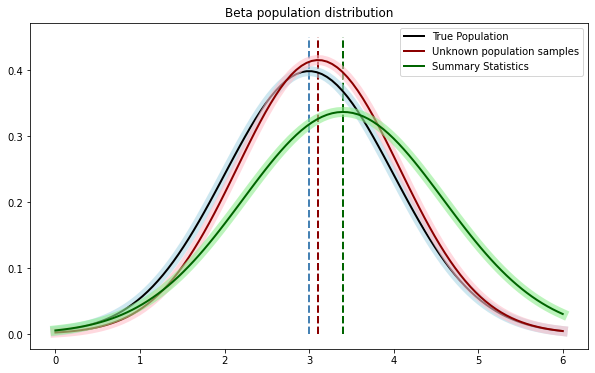

In [194]:
# beta population distribution -------------------------------*
# params
mu        = 3
variance  = 1

# distribution
sigma = math.sqrt(variance)
x     = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
y     = stats.norm.pdf(x, mu, sigma)

# random sample
# rv = stats.norm(mu, sigma)
# r  = rv.rvs(size=10000)

# vis 
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(x, y, 'lightblue', lw=10, alpha=0.6)
ax.plot(x, y, 'k-', lw=2, label='True Population')
# ax.hist(r, bins=80, density=True, color='pink', histtype='stepfilled', alpha=0.4)
ax.vlines(x=mu, ymin=0, ymax=0.45, lw=2, color='steelblue', linestyles='dashed')


# fit (unknown) true sample values
rv_beta_true = stats.norm(beta_true_mu, beta_true_std).pdf(x)
ax.plot(x, rv_beta_true, 'pink', lw=10, alpha=0.6)
ax.plot(x, rv_beta_true, 'k-', lw=2, color='darkred', label='Unknown population samples')
ax.vlines(x=beta_true_mu, ymin=0, ymax=0.45, lw=2, color='darkred', linestyles='dashed')

# fit approx values 
rv_beta_apprx = stats.norm(beta_aprx_mu, beta_aprx_std).pdf(x)
ax.plot(x, rv_beta_apprx, 'lightgreen', lw=10, alpha=0.6)
ax.plot(x, rv_beta_apprx, 'k-', lw=2, color='darkgreen', label='Summary Statistics')
ax.vlines(x=beta_aprx_mu, ymin=0, ymax=0.45, lw=2, color='darkgreen', linestyles='dashed')

plt.title('Beta population distribution')
plt.legend()
plt.show()
# beta population distribution -------------------------------*

----

# Hierarchical Bayesian RL

Fitting an Hierarchical Bayesian RL model.

[reference](https://docs.pymc.io/en/v3/pymc-examples/examples/generalized_linear_models/GLM-hierarchical.html)

In [3]:
%%capture
%%time
!pip upgrade arviz==0.6.1
!pip install git+https://github.com/pymc-devs/pymc3
!pip install git+git://github.com/arviz-devs/arviz.git

In [2]:
from scipy import stats
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import math
import pymc3 as pm
import pandas as pd
from tqdm import tqdm
import theano
import theano.tensor as tt
import arviz as az

In [9]:
data['subject_0'].keys()

dict_keys(['actions', 'rewards', 'true_alpha', 'true_beta', 'Qs'])

In [10]:
n_samples

100

In [ ]:
# Convert to table data structure -------------*
%%time
if 'df' in globals(): del df

for subject in tqdm(data.keys()):
  if 'df' not in globals():
    df = pd.DataFrame({
        'subject' : [subject] * n_samples, 
        'actions' : data[subject]['actions'],
        'true_alpha' : data[subject]['true_alpha'] * n_samples,
        'true_beta' : data[subject]['true_beta'] * n_samples
        })
  else:
    df = df.append(df, ignore_index=False)

df.shape

 11%|█         | 11/100 [00:16<00:00, 100.82it/s]

In [ ]:
%%time
# Bayes RL  ==================================================================================================================================*

# each subject
for i in tqdm(range(n_samples)):
  actions = data['subject_'+str(i)]['actions']
  rewards = data['subject_'+str(i)]['rewards']

  with pm.Model() as bayesian_reinforcement_learning:

    # data
    actions_  = pm.Data('actions', actions)
    rewards_  = pm.Data('rewards', rewards)

    # priors
    alpha = pm.Beta('alpha', 1, 1)
    beta  = pm.HalfNormal('beta', 10)

    # model 
    # init Qs
    Qs = 0.3333 * tt.ones(3, dtype='float64')

    # Compute the Q values for each trial
    Qs, _ = theano.scan(
        fn=lambda action, reward, Qs, alpha: tt.set_subtensor(Qs[action], Qs[action] + alpha * (reward - Qs[action])),
        sequences=[actions_, rewards_],
        outputs_info=[Qs],
        non_sequences=[alpha])


    BQs = beta*Qs
    pi =  tt.nnet.softmax(BQs)
    like = pm.Categorical('like', p=pi, observed=actions_)

    # opt
    trace = pm.sample(tune=1000, chains=2, target_accept=0.85) # tune=5000, target_accept=0.9 njobs=4 ,target_accept=0.99
    idata = az.from_pymc3(trace)
    pm.traceplot(idata)


    # store estimates
    data['subject_'+str(i)]['trace'] = trace
    data['subject_'+str(i)]['idata'] = idata
  # Bayes RL  ==================================================================================================================================*